<a href="https://colab.research.google.com/github/Rey-irl/Predicting-Real-Estate-Prices-with-MLR-A-Case-Study-from-Ames-Iowa/blob/main/Predicting_Housing_Prices_using_MLR_%7C_Ames%2C_Iowa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Factors Influencing Housing Prices Using Multiple Linear Regression

In [ ]:
import pandas as pd #Data manipulation and analysis
import numpy as np  # For mathematical an logical operations on arrays can be performed
import seaborn as sns #It provides a high-level interface for drawing attractive and informative statistical graphics
import matplotlib as mpl #It is a cross-platform, data visualization and graphical plotting library
import matplotlib.pyplot as plt #pyplot is a plotting library used for 2D graphics
import plotly.express as px
from scipy import stats
import pylab

%matplotlib inline

sns.set(color_codes=True)

In [ ]:
#Reading dat from file CSV
df=pd.read_csv('housing.csv')

## 2.3 Data Understanding

### Exploratory Data Analysis
This should include levels of measurement and descriptive statistics for
all variables, as well as visualisations that provide an insight into the variables in the data set.

In [ ]:
df.head()

,Lot_Frontage,Lot_Area,Bldg_Type,House_Style,Overall_Cond,Year_Built,Exter_Cond,Total_Bsmt_SF,First_Flr_SF,Second_Flr_SF,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,Fireplaces,Longitude,Latitude,Sale_Price
0,141,31770,OneFam,One_Story,Average,1960,Typical,1080,1656,0,1,0,3,1,2,-93.619754,42.054035,215000
1,80,11622,OneFam,One_Story,Above_Average,1961,Typical,882,896,0,1,0,2,1,0,-93.619756,42.053014,105000
2,81,14267,OneFam,One_Story,Above_Average,1958,Typical,1329,1329,0,1,1,3,1,0,-93.619387,42.052659,172000
3,93,11160,OneFam,One_Story,Average,1968,Typical,2110,2110,0,2,1,3,1,2,-93.617320,42.051245,244000
4,74,13830,OneFam,Two_Story,Average,1997,Typical,928,928,701,2,1,3,1,1,-93.638933,42.060899,189900


It has made some changes into the data, these changes are explained in the code.

In [ ]:
pd.options.display.float_format= "{:,.3f}".format # float variables are displaying 3 decimal places.

df=df[["Year_Built", "Lot_Frontage", "Lot_Area","Bldg_Type","House_Style","Overall_Cond","Exter_Cond",
       "Total_Bsmt_SF","First_Flr_SF","Second_Flr_SF","Full_Bath","Half_Bath","Bedroom_AbvGr",
       "Kitchen_AbvGr","Fireplaces","Longitude","Latitude","Sale_Price"]]   #Column Year_Built is indexed as first column

df= df.sort_values(by='Year_Built')                                      #Rows are sorted by year
df.head()

,Year_Built,Lot_Frontage,Lot_Area,Bldg_Type,House_Style,Overall_Cond,Exter_Cond,Total_Bsmt_SF,First_Flr_SF,Second_Flr_SF,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,Fireplaces,Longitude,Latitude,Sale_Price
1143,1872,50,5250,OneFam,Two_Story,Average,Good,684,938,1215,2,0,4,1,0,-93.610,42.029,122000
188,1875,54,6342,OneFam,One_and_Half_Fin,Very_Good,Good,780,780,240,1,0,2,1,0,-93.672,42.034,94000
1691,1879,75,13500,OneFam,Two_and_Half_Unf,Very_Good,Good,819,1312,1142,2,0,3,1,1,-93.612,42.028,185000
626,1880,65,11700,OneFam,Two_Story,Good,Typical,1240,1320,1320,1,1,4,1,1,-93.612,42.029,265979
704,1880,120,26400,OneFam,Two_Story,Good,Typical,0,1288,728,1,0,4,1,1,-93.680,42.033,131000


In [ ]:
df.shape

(2413, 18)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2413 entries, 1143 to 221
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Year_Built     2413 non-null   int64  
 1   Lot_Frontage   2413 non-null   int64  
 2   Lot_Area       2413 non-null   int64  
 3   Bldg_Type      2413 non-null   object 
 4   House_Style    2413 non-null   object 
 5   Overall_Cond   2413 non-null   object 
 6   Exter_Cond     2413 non-null   object 
 7   Total_Bsmt_SF  2413 non-null   int64  
 8   First_Flr_SF   2413 non-null   int64  
 9   Second_Flr_SF  2413 non-null   int64  
 10  Full_Bath      2413 non-null   int64  
 11  Half_Bath      2413 non-null   int64  
 12  Bedroom_AbvGr  2413 non-null   int64  
 13  Kitchen_AbvGr  2413 non-null   int64  
 14  Fireplaces     2413 non-null   int64  
 15  Longitude      2413 non-null   float64
 16  Latitude       2413 non-null   float64
 17  Sale_Price     2413 non-null   int64  
dtypes: flo

The function info() allows to describe that the database was built by 2, 413 rows and 10 columns. Also, it displays the name of each column, the number of non-nulls and the type of values contained.

Below is a description of each value according to the "Statistic for Data Analytics CA" file.

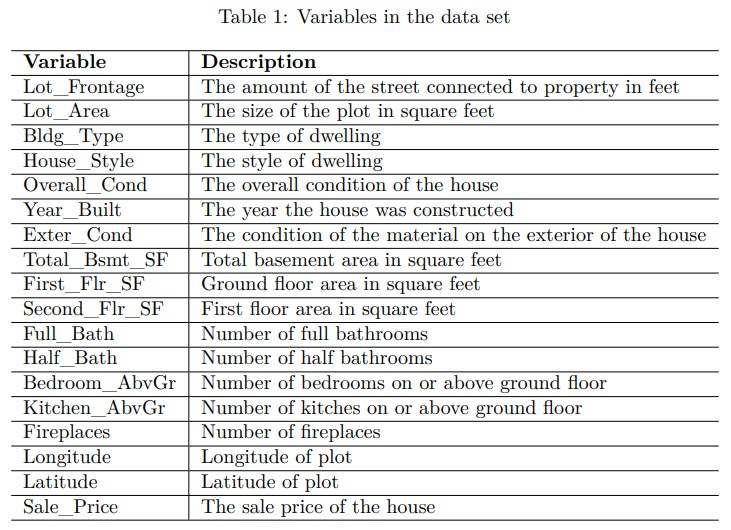

In [ ]:
from IPython.display import Image

Image("Fig 1.jpg")

### Duplicate values
Fuction helps to sum of duplicate values if they are presented in the dataset.

In [ ]:
df.duplicated().sum()

0

### Unique values

Using the function .uinique(), it is easy to visualize how many gruops of values have each variable, for example is functional for the categorical data.

In [ ]:
df.nunique()

Year_Built        114
Lot_Frontage      124
Lot_Area         1652
Bldg_Type           5
House_Style         8
Overall_Cond        9
Exter_Cond          5
Total_Bsmt_SF     943
First_Flr_SF      979
Second_Flr_SF     569
Full_Bath           5
Half_Bath           3
Bedroom_AbvGr       7
Kitchen_AbvGr       4
Fireplaces          5
Longitude        2309
Latitude         2303
Sale_Price        790
dtype: int64

In [ ]:
print(df.Year_Built.unique())

[1872 1875 1879 1880 1882 1885 1890 1892 1893 1895 1898 1900 1902 1904
 1905 1906 1908 1910 1912 1913 1914 1915 1916 1917 1918 1919 1920 1921
 1922 1923 1924 1925 1926 1927 1928 1929 1930 1931 1932 1934 1935 1936
 1937 1938 1939 1940 1941 1942 1945 1946 1947 1948 1949 1950 1951 1952
 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962 1963 1964 1965 1966
 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979 1980
 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994
 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010]


In [ ]:
print(df.Bldg_Type.unique())

['OneFam' 'TwoFmCon' 'Duplex' 'Twnhs' 'TwnhsE']


In [ ]:
print(df.House_Style.unique())

['Two_Story' 'One_and_Half_Fin' 'Two_and_Half_Unf' 'Two_and_Half_Fin'
 'One_Story' 'One_and_Half_Unf' 'SLvl' 'SFoyer']


In [ ]:
print(df.Overall_Cond.unique())

['Average' 'Very_Good' 'Good' 'Excellent' 'Below_Average' 'Above_Average'
 'Poor' 'Very_Poor' 'Fair']


In [ ]:
print(df.Exter_Cond.unique())

['Good' 'Typical' 'Excellent' 'Fair' 'Poor']


In [ ]:
print(df.Full_Bath.unique())

[2 1 3 0 4]


In [ ]:
print(df.Half_Bath.unique())

[0 1 2]


In [ ]:
print(df.Bedroom_AbvGr.unique())

[4 2 3 5 1 6 0]


In [ ]:
print(df.Kitchen_AbvGr.unique())

[1 2 3 0]


In [ ]:
print(df.Fireplaces.unique())

[0 1 2 3 4]


### Missing values

The fuction allows to see if there are null values, even, this is not the case. So it can continue exploring the data.

In [ ]:
df.isnull().sum()

Year_Built       0
Lot_Frontage     0
Lot_Area         0
Bldg_Type        0
House_Style      0
Overall_Cond     0
Exter_Cond       0
Total_Bsmt_SF    0
First_Flr_SF     0
Second_Flr_SF    0
Full_Bath        0
Half_Bath        0
Bedroom_AbvGr    0
Kitchen_AbvGr    0
Fireplaces       0
Longitude        0
Latitude         0
Sale_Price       0
dtype: int64

### Visualization of EDA

The fuction .describe() allows to have a quickly look about how are distribuying each of the columns, but it just for numerical data, for example "Lot_Area" has a mean= 10060, min= 1,300 and max=215,245, so, it gives an idea that the values on this column are not normally distributed.

In [ ]:
df.describe()

,Year_Built,Lot_Frontage,Lot_Area,Total_Bsmt_SF,First_Flr_SF,Second_Flr_SF,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,Fireplaces,Longitude,Latitude,Sale_Price
count,"2,413.000","2,413.000","2,413.000","2,413.000","2,413.000","2,413.000","2,413.000","2,413.000","2,413.000","2,413.000","2,413.000","2,413.000","2,413.000","2,413.000"
mean,"1,969.436",55.462,"10,060.208","1,022.828","1,133.857",339.243,1.539,0.378,2.855,1.040,0.603,-93.642,42.034,"175,567.643"
std,29.488,33.542,"8,222.760",408.978,366.442,423.198,0.545,0.498,0.813,0.201,0.649,0.026,0.018,"70,979.614"
min,"1,872.000",0.000,"1,300.000",0.000,334.000,0.000,0.000,0.000,0.000,0.000,0.000,-93.693,41.986,"35,000.000"
25%,"1,953.000",37.000,"7,390.000",784.000,866.000,0.000,1.000,0.000,2.000,1.000,0.000,-93.662,42.022,"129,500.000"
50%,"1,971.000",60.000,"9,360.000",970.000,"1,060.000",0.000,2.000,0.000,3.000,1.000,1.000,-93.640,42.035,"159,000.000"
75%,"1,998.000",77.000,"11,404.000","1,246.000","1,350.000",704.000,2.000,1.000,3.000,1.000,1.000,-93.621,42.048,"206,900.000"
max,"2,010.000",313.000,"215,245.000","3,206.000","3,820.000","1,872.000",4.000,2.000,6.000,3.000,4.000,-93.577,42.063,"755,000.000"


### Visualization of Histogram


In [ ]:
year_hist= px.histogram(df, x='Year_Built', title="Year_Built",barmode='group', width=600, height=350)
year_hist.update_layout(bargap=0.2)
year_hist.show()

Front_hist= px.histogram(df, x='Lot_Frontage', title="Lot_Frontage", barmode='group', width=600, height=350)
Front_hist.update_layout(bargap=0.2)
Front_hist.show()

Area_hist= px.histogram(df, x='Lot_Area', title="Lot_Area", barmode='group', width=600, height=350)
Area_hist.update_layout(bargap=0.2)
Area_hist.show()

Total_hist= px.histogram(df, x='Total_Bsmt_SF', title="Total_Bsmt_SF", barmode='group', width=600, height=350)
Total_hist.update_layout(bargap=0.2)
Total_hist.show()

First_hist= px.histogram(df, x='First_Flr_SF', title="First_Flr_SF", barmode='group', width=600, height=350)
First_hist.update_layout(bargap=0.2)
First_hist.show()

Second_hist= px.histogram(df, x='Second_Flr_SF', title="Second_Flr_SF", barmode='group', width=600, height=350)
Second_hist.update_layout(bargap=0.2)
Second_hist.show()

1. Year_Built: it seem that the plot has 3 shapes, in the middle is kind of normal distribution, this variable helps to see 3 different periods of building, before 1910 the building of house was minimum, few houses around, from 1950 to 1980 was an increment above of 100 houses.
2. Lot_Frontage: first, there is remarkable outlier, second the values are showing a normal distribution but also some points are clearly outliers.
3. Lot_Area: this plot has a right skew with a shape similar to normal distribution.
4. Total_Bsmt_SF:this plot has values betwwen 0 to 49, these values are out of the shape.
5. First_Flr_SF: it is similar to Total_Bsmt_SF, even it does not have values out of the shape. This variable makes sense to share the shape because usually, the first floor is similar to the size of a basement.  
6. Second_Flr_SF: it does not have any shape,which one could say that there are few houses with second floor.

In [ ]:
Full_hist= px.histogram(df, x='Full_Bath', barmode='group', width=600, height=350)
Full_hist.update_layout(bargap=0.2)
Full_hist.show()

Half_hist= px.histogram(df, x='Half_Bath', barmode='group', width=600, height=350)
Half_hist.update_layout(bargap=0.2)
Half_hist.show()

bedroom_hist= px.histogram(df, x='Bedroom_AbvGr', barmode='group', width=600, height=350)
bedroom_hist.update_layout(bargap=0.2)
bedroom_hist.show()

kitchen_hist= px.histogram(df, x='Kitchen_AbvGr', barmode='group', width=600, height=350)
kitchen_hist.update_layout(bargap=0.2)
kitchen_hist.show()

fire_hist= px.histogram(df, x='Fireplaces', barmode='group', width=600, height=350)
fire_hist.update_layout(bargap=0.2)
fire_hist.show()

The histograms above are describing the counting of:

        *Number of full bathrooms:for example the most of the houses have between 1 or 2 full bathrooms.
        *Number of half bathrooms:the bathrooms just have toilet and no showers, the plot shows that only 16                                                 observations have 2 half bathrooms.
        *Number of Bedrooms:the most of the houses have between 2 and 4 bedrooms.
        *Number of Kitchen: Usually, the houses have just one kitchen, which is the number most popular in the plot but                                 also shows that there are houses with 2 Kitchen and one house with 3 kitchen.
        *Number of fireplaces:the houses have bewteen cero or one fireplace, 183 houses have two fireplaces, and rarely 3                                 or 4 fireplaces.

### Location
The next plot allows the distribution of the houses on the map by "Latitude" and "Longitude" coming from the dataset, so it can be appreciated, several of the houses are located in city center of Ames, Iowa and the rest south just, in the other side of the river, here is plotting using the variable "House_Style". The most popular of house style is one story.

In [ ]:
fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude", color="House_Style",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10,
                  mapbox_style="carto-positron")
fig.show()



### Variable "Sale_Price"

The next Histogram give an idea about how the values of this variable are distributing similar to normal distribution, with a right skew. In additon, it can see that there are some values, which could consider as outliers.

In [ ]:
price_hist= px.histogram(df, x='Sale_Price', barmode='group', width=600, height=350)
price_hist.update_layout(bargap=0.2)
price_hist.show()

### Check Variables type Object

The table below displays how many gruops have each of the categorical variables and what is the most popular (mode). These variables will be plotted as well by a pie graphic.

In [ ]:
df.describe(include='object')

,Bldg_Type,House_Style,Overall_Cond,Exter_Cond
count,2413,2413,2413,2413
unique,5,8,9,5
top,OneFam,One_Story,Average,Typical
freq,2002,1189,1282,2081


These graphics are getting the percentage of each category into the categorical count, for example in Type of dwelling, the 84 ...................................................................................................................................................

In [ ]:
# plotting the pie chart
bldg_fig = px.pie(df, values="Sale_Price", names="Bldg_Type", width=600, height=350)
bldg_fig.update_layout(title_text='Type of dwelling')
bldg_fig.show()

style_fig = px.pie(df, values="Sale_Price", names="House_Style", width=600, height=350)
style_fig.update_layout(title_text='Style of dwelling')
style_fig.show()

overall_fig = px.pie(df, values="Sale_Price", names="Overall_Cond", width=600, height=350)
overall_fig.update_layout(title_text='Overall Condition of the house')
overall_fig.show()

exter_fig = px.pie(df, values="Sale_Price", names="Exter_Cond", width=600, height=350)
exter_fig.update_layout(title_text='Condition of the Material on the exterior of the house')
exter_fig.show()


### Correlation & Heatmap
One of the most important statistical measure to know the relationship between variables,also describe the size and direction of this relatioship. The visualization for this measure is to use a heatmap, which one is increasing the intensity colour when is more strong the relation between them.

Another plot that helps to visualize the direction and shape are getting the variables, is scatterplot and for this project will use PairGrid fuction to join each of the scatterplot.


,Year_Built,Lot_Frontage,Lot_Area,Total_Bsmt_SF,First_Flr_SF,Second_Flr_SF,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,Fireplaces,Longitude,Latitude,Sale_Price
Year_Built,1.000,-0.033,0.006,0.384,0.274,0.019,0.441,0.274,-0.042,-0.138,0.160,-0.425,0.213,0.533
Lot_Frontage,-0.033,1.000,0.112,0.139,0.196,-0.020,0.047,-0.044,0.107,0.021,0.029,-0.002,0.026,0.160
Lot_Area,0.006,0.112,1.000,0.209,0.305,0.015,0.119,0.011,0.138,-0.013,0.239,-0.099,-0.051,0.275
Total_Bsmt_SF,0.384,0.139,0.209,1.000,0.767,-0.216,0.317,-0.088,0.091,-0.028,0.313,-0.153,0.165,0.642
First_Flr_SF,0.274,0.196,0.305,0.767,1.000,-0.265,0.367,-0.136,0.137,0.076,0.400,-0.116,0.126,0.635
Second_Flr_SF,0.019,-0.020,0.015,-0.216,-0.265,1.000,0.421,0.626,0.511,0.084,0.175,-0.058,0.087,0.293
Full_Bath,0.441,0.047,0.119,0.317,0.367,0.421,1.000,0.176,0.383,0.196,0.245,-0.226,0.186,0.549
Half_Bath,0.274,-0.044,0.011,-0.088,-0.136,0.626,0.176,1.000,0.271,-0.044,0.187,-0.114,0.154,0.292
Bedroom_AbvGr,-0.042,0.107,0.138,0.091,0.137,0.511,0.383,0.271,1.000,0.242,0.097,-0.034,0.024,0.184
Kitchen_AbvGr,-0.138,0.021,-0.013,-0.028,0.076,0.084,0.196,-0.044,0.242,1.000,-0.110,0.080,-0.049,-0.114


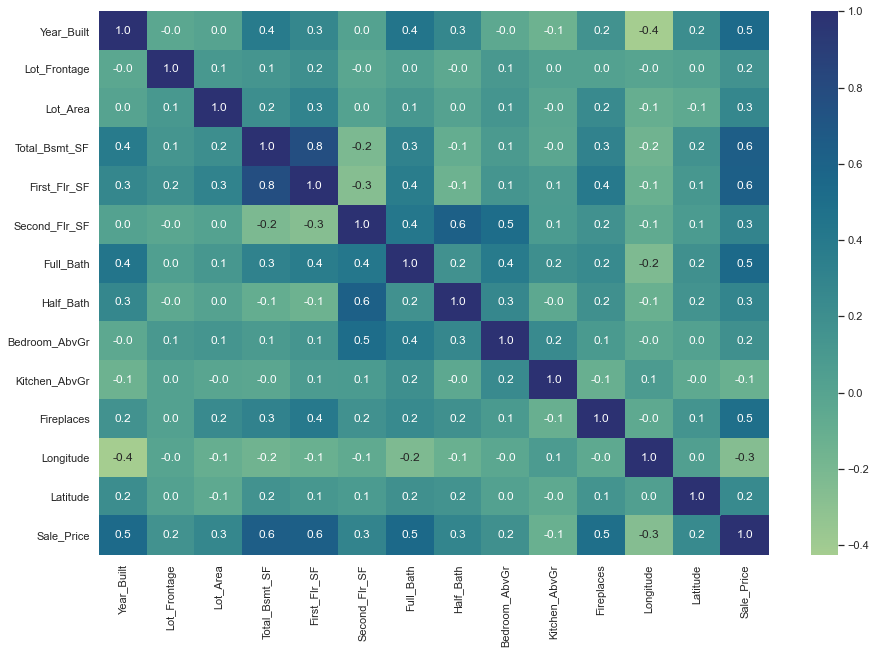

In [ ]:
plt.figure(figsize=(15,10))
corr = df.corr()
sns.heatmap(corr,cmap="crest",annot=True, fmt=".1f")
corr

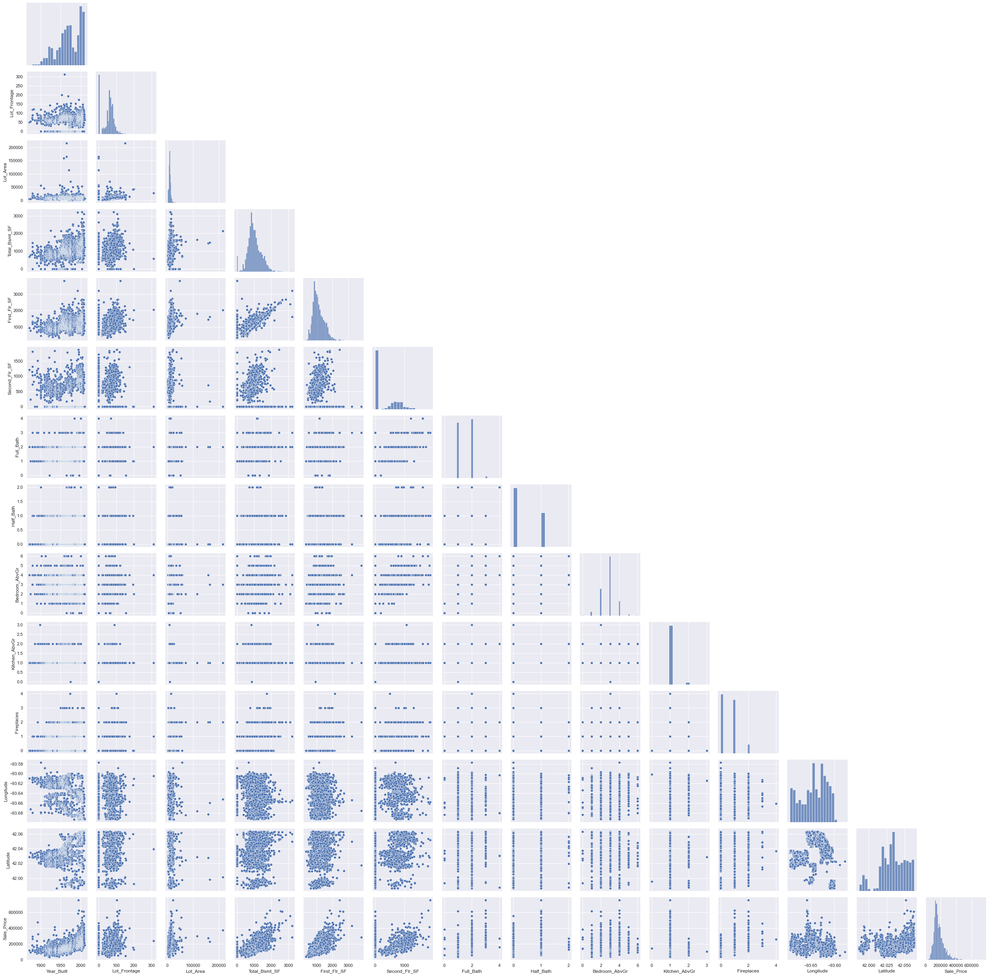

In [ ]:
g = sns.PairGrid(df, diag_sharey=False, corner=True)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

Using the heatmap, which helps to know which are the variables with a significant correlation and display by separately.
The variable,that has more significant relationship with other variables is "Sale_Price". Therefore, the first plots are built versus "Sale_Price", this plot allows to see the direction of the variables.

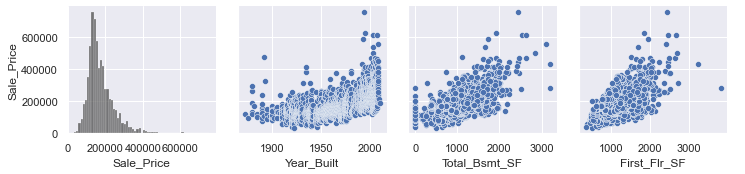

In [ ]:
x_vars = ['Sale_Price','Year_Built', 'Total_Bsmt_SF', 'First_Flr_SF']
y_vars = ['Sale_Price']
matrix_corr = sns.PairGrid(df, x_vars=x_vars, y_vars=y_vars)
matrix_corr.map_diag(sns.histplot, color=".3")
matrix_corr.map_offdiag(sns.scatterplot)
matrix_corr.add_legend()

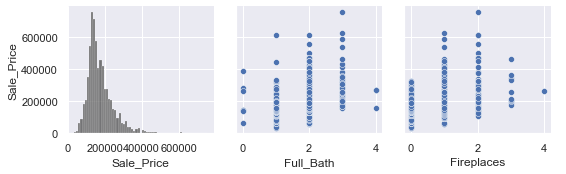

In [ ]:
x_vars_2 = ['Sale_Price','Full_Bath','Fireplaces']
y_vars_2 = ['Sale_Price']
matrix_corr_2 = sns.PairGrid(df, x_vars=x_vars_2, y_vars=y_vars_2)
matrix_corr_2.map_diag(sns.histplot, color=".3")
matrix_corr_2.map_offdiag(sns.scatterplot)
matrix_corr_2.add_legend()

In [ ]:
half_2 = px.scatter(df, x="Half_Bath", y="Second_Flr_SF",width=400, height=250)
half_2.show()

bed_2 = px.scatter(df, x="Bedroom_AbvGr", y="Second_Flr_SF", width=400, height=250)
bed_2.show()

first_Total = px.scatter(df, x="First_Flr_SF", y="Total_Bsmt_SF", width=400, height=250)
first_Total.show()

## 2.4 Data Preparation

### Handling Outliers

There are different ways to handle Outliers in this case, aacording to the visualization, some of the variables have a shape similar to normal distribution, for that, it will be apply algorithmic transformation, but before, it is important to check which variables can be handle on this way. This is through knowing the mean, the deviation standar, median and mainly by skewness and Kurtosis.

In [ ]:
mean= df.mean()
std= df.std()
median= df.median()
skew= df.skew()
kurtosis=df.kurtosis()

data= pd.DataFrame(data=[mean,std,median,skew,kurtosis])
data= data.transpose()
data= data.rename(columns={0:'Mean',1:'Std Deviation',2:'Median',3:'Skew',4:'Kurtosis'})
data

,Mean,Std Deviation,Median,Skew,Kurtosis
Year_Built,"1,969.436",29.488,"1,971.000",-0.587,-0.439
Lot_Frontage,55.462,33.542,60.000,-0.081,1.166
Lot_Area,"10,060.208","8,222.760","9,360.000",13.394,270.466
Total_Bsmt_SF,"1,022.828",408.978,970.000,0.456,1.716
First_Flr_SF,"1,133.857",366.442,"1,060.000",1.043,2.257
Second_Flr_SF,339.243,423.198,0.000,0.804,-0.559
Full_Bath,1.539,0.545,2.000,0.245,-0.570
Half_Bath,0.378,0.498,0.000,0.664,-1.163
Bedroom_AbvGr,2.855,0.813,3.000,0.184,1.472
Kitchen_AbvGr,1.040,0.201,1.000,4.682,21.975


#### Transformation of "Lot_Area"

Skewness is  -0.5137145647219811
Kurtosis is  3.7931913572039453


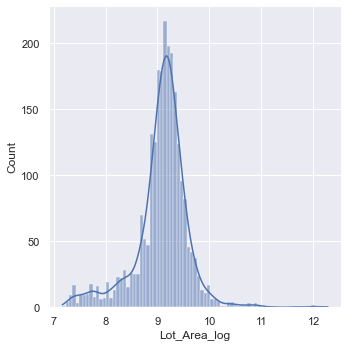

In [ ]:
df['Lot_Area_log']=np.log(df['Lot_Area'])
print('Skewness is ', df['Lot_Area_log'].skew())
print('Kurtosis is ', df['Lot_Area_log'].kurtosis())
sns.displot(df['Lot_Area_log'], kde=True)

((array([-3.44340978, -3.19582455, -3.05869451, ...,  3.05869451,
          3.19582455,  3.44340978]),
  array([ 7.17011954,  7.29301768,  7.29709101, ..., 11.97665948,
         12.01163802, 12.27953219])),
 (0.4927067607134196, 9.07998485029262, 0.952812711224993))

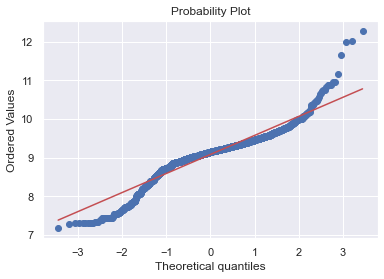

In [ ]:
stats.probplot(df.Lot_Area_log, plot=pylab)

#### Transformation of "First_Flr_FS"

Skewness is  0.02366156693622356
Kurtosis is  0.031513946608060284


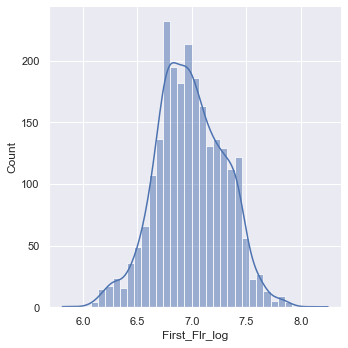

In [ ]:
df['First_Flr_log']=np.log(df['First_Flr_SF'])
print('Skewness is ', df['First_Flr_log'].skew())
print('Kurtosis is ', df['First_Flr_log'].kurtosis())
sns.displot(df['First_Flr_log'], kde=True)

((array([-3.44340978, -3.19582455, -3.05869451, ...,  3.05869451,
          3.19582455,  3.44340978]),
  array([5.81114099, 5.91889385, 6.06842559, ..., 7.91059061, 8.07961803,
         8.2480057 ])),
 (0.3137636638735493, 6.98398594457568, 0.9982871677602443))

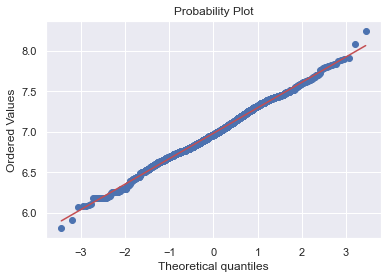

In [ ]:
stats.probplot(df.First_Flr_log, plot=pylab)

#### Transformation of "Sale_Price"

In [ ]:
b_sale=px.box(df, x="Sale_Price",  points="outliers", width=500, height=350)
b_sale.show()

Skewness is  0.1558492996322687
kurtosis is  0.6753836338253532


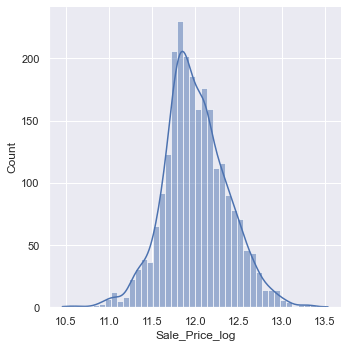

In [ ]:
df['Sale_Price_log']=np.log(df['Sale_Price'])
print('Skewness is ', df['Sale_Price_log'].skew())
print('kurtosis is ',df['Sale_Price_log'].kurtosis())
sns.displot(df['Sale_Price_log'], kde=True)

((array([-3.44340978, -3.19582455, -3.05869451, ...,  3.05869451,
          3.19582455,  3.44340978]),
  array([10.46310334, 10.5789798 , 10.59663473, ..., 13.32937755,
         13.34550693, 13.53447303])),
 (0.36971234410812726, 12.005241230028094, 0.9958697785567189))

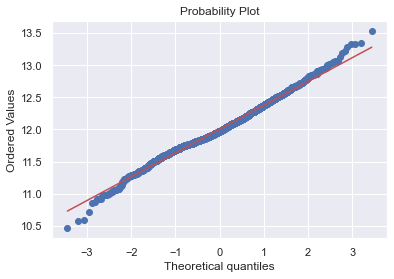

In [ ]:
stats.probplot(df.Sale_Price_log, plot=pylab)

In [ ]:
b_sale_log=px.box(df, x="Sale_Price_log",  points="outliers", width=500, height=350)
b_sale_log.show()

#### Correlation between original variables and transformed variables

,Year_Built,Lot_Frontage,Lot_Area,Total_Bsmt_SF,First_Flr_SF,Second_Flr_SF,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,Fireplaces,Longitude,Latitude,Sale_Price,Lot_Area_log,First_Flr_log,Sale_Price_log
Year_Built,1.000,-0.033,0.006,0.384,0.274,0.019,0.441,0.274,-0.042,-0.138,0.160,-0.425,0.213,0.533,0.006,0.270,0.587
Lot_Frontage,-0.033,1.000,0.112,0.139,0.196,-0.020,0.047,-0.044,0.107,0.021,0.029,-0.002,0.026,0.160,0.268,0.196,0.133
Lot_Area,0.006,0.112,1.000,0.209,0.305,0.015,0.119,0.011,0.138,-0.013,0.239,-0.099,-0.051,0.275,0.701,0.302,0.265
Total_Bsmt_SF,0.384,0.139,0.209,1.000,0.767,-0.216,0.317,-0.088,0.091,-0.028,0.313,-0.153,0.165,0.642,0.306,0.758,0.639
First_Flr_SF,0.274,0.196,0.305,0.767,1.000,-0.265,0.367,-0.136,0.137,0.076,0.400,-0.116,0.126,0.635,0.446,0.975,0.620
Second_Flr_SF,0.019,-0.020,0.015,-0.216,-0.265,1.000,0.421,0.626,0.511,0.084,0.175,-0.058,0.087,0.293,0.016,-0.265,0.300
Full_Bath,0.441,0.047,0.119,0.317,0.367,0.421,1.000,0.176,0.383,0.196,0.245,-0.226,0.186,0.549,0.163,0.355,0.580
Half_Bath,0.274,-0.044,0.011,-0.088,-0.136,0.626,0.176,1.000,0.271,-0.044,0.187,-0.114,0.154,0.292,0.010,-0.151,0.315
Bedroom_AbvGr,-0.042,0.107,0.138,0.091,0.137,0.511,0.383,0.271,1.000,0.242,0.097,-0.034,0.024,0.184,0.272,0.155,0.224
Kitchen_AbvGr,-0.138,0.021,-0.013,-0.028,0.076,0.084,0.196,-0.044,0.242,1.000,-0.110,0.080,-0.049,-0.114,0.019,0.079,-0.125


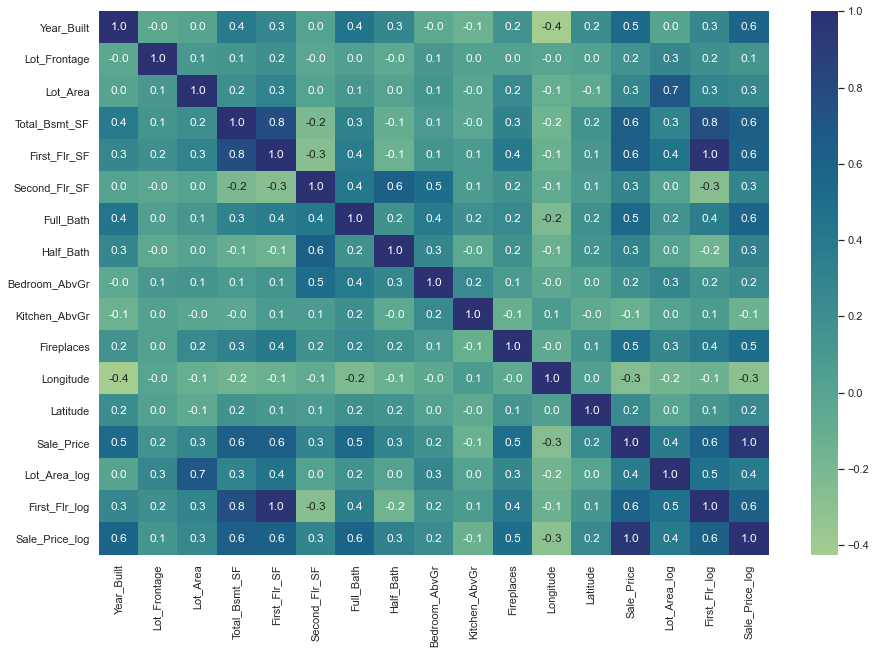

In [ ]:
plt.figure(figsize=(15,10))
corr_2 = df.corr()       #It has been used original dataframe, which one includes transformed variables
sns.heatmap(corr_2,cmap="crest",annot=True, fmt=".1f")
corr_2

In [ ]:
df_t= df.drop(columns=['Lot_Area','First_Flr_SF','Sale_Price'])
df_t

,Year_Built,Lot_Frontage,Bldg_Type,House_Style,Overall_Cond,Exter_Cond,Total_Bsmt_SF,Second_Flr_SF,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,Fireplaces,Longitude,Latitude,Lot_Area_log,First_Flr_log,Sale_Price_log
1143,1872,50,OneFam,Two_Story,Average,Good,684,1215,2,0,4,1,0,-93.610,42.029,8.566,6.844,11.712
188,1875,54,OneFam,One_and_Half_Fin,Very_Good,Good,780,240,1,0,2,1,0,-93.672,42.034,8.755,6.659,11.451
1691,1879,75,OneFam,Two_and_Half_Unf,Very_Good,Good,819,1142,2,0,3,1,1,-93.612,42.028,9.510,7.179,12.128
626,1880,65,OneFam,Two_Story,Good,Typical,1240,1320,1,1,4,1,1,-93.612,42.029,9.367,7.185,12.491
704,1880,120,OneFam,Two_Story,Good,Typical,0,728,1,0,4,1,1,-93.680,42.033,10.181,7.161,11.783
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446,2008,78,OneFam,One_Story,Average,Typical,1614,0,2,1,3,1,1,-93.643,42.054,9.231,7.413,12.459
211,2009,83,OneFam,One_Story,Average,Typical,1212,0,2,0,3,1,0,-93.666,42.025,9.251,7.100,12.134
220,2009,94,OneFam,One_Story,Average,Typical,1226,0,2,0,3,1,0,-93.692,42.025,9.250,7.112,12.201
58,2009,72,OneFam,Two_Story,Average,Typical,756,783,2,1,3,1,0,-93.650,42.052,9.064,6.639,12.279


### Dummies

In [ ]:
bldg = pd.get_dummies(df_t['Bldg_Type'], drop_first = True)
house = pd.get_dummies(df_t['House_Style'], drop_first = True)
overall = df_t['Overall_Cond'].replace(['Excellent','Very_Good','Good','Above_Average','Average','Below_Average','Fair','Poor','Very_Poor'],
                                     [9,8,7,6,5,4,3,2,1], inplace=True)
exter= df_t['Exter_Cond'].replace(['Excellent','Good','Typical','Fair','Poor'],
                                [5,4,3,2,1], inplace=True)
df1= pd.concat([df_t, bldg, house,overall, exter], axis = 1)
df1= df1.drop(columns=['Bldg_Type','House_Style'])

In [ ]:
df1

,Year_Built,Lot_Frontage,Overall_Cond,Exter_Cond,Total_Bsmt_SF,Second_Flr_SF,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,...,Twnhs,TwnhsE,TwoFmCon,One_and_Half_Fin,One_and_Half_Unf,SFoyer,SLvl,Two_Story,Two_and_Half_Fin,Two_and_Half_Unf
1143,1872,50,5,4,684,1215,2,0,4,1,...,0,0,0,0,0,0,0,1,0,0
188,1875,54,8,4,780,240,1,0,2,1,...,0,0,0,1,0,0,0,0,0,0
1691,1879,75,8,4,819,1142,2,0,3,1,...,0,0,0,0,0,0,0,0,0,1
626,1880,65,7,3,1240,1320,1,1,4,1,...,0,0,0,0,0,0,0,1,0,0
704,1880,120,7,3,0,728,1,0,4,1,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446,2008,78,5,3,1614,0,2,1,3,1,...,0,0,0,0,0,0,0,0,0,0
211,2009,83,5,3,1212,0,2,0,3,1,...,0,0,0,0,0,0,0,0,0,0
220,2009,94,5,3,1226,0,2,0,3,1,...,0,0,0,0,0,0,0,0,0,0
58,2009,72,5,3,756,783,2,1,3,1,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
column=df1.pop('Sale_Price_log')
df1.insert(0, 'Sale_Price_log', column)
df1.columns

Index(['Sale_Price_log', 'Year_Built', 'Lot_Frontage', 'Overall_Cond',
       'Exter_Cond', 'Total_Bsmt_SF', 'Second_Flr_SF', 'Full_Bath',
       'Half_Bath', 'Bedroom_AbvGr', 'Kitchen_AbvGr', 'Fireplaces',
       'Longitude', 'Latitude', 'Lot_Area_log', 'First_Flr_log', 'OneFam',
       'Twnhs', 'TwnhsE', 'TwoFmCon', 'One_and_Half_Fin', 'One_and_Half_Unf',
       'SFoyer', 'SLvl', 'Two_Story', 'Two_and_Half_Fin', 'Two_and_Half_Unf'],
      dtype='object')

After it has been transformed categorical variables, it is applied correlation for having a look if they are contributing something to Sale Price.

,Sale_Price_log,Year_Built,Lot_Frontage,Overall_Cond,Exter_Cond,Total_Bsmt_SF,Second_Flr_SF,Full_Bath,Half_Bath,Bedroom_AbvGr,...,Twnhs,TwnhsE,TwoFmCon,One_and_Half_Fin,One_and_Half_Unf,SFoyer,SLvl,Two_Story,Two_and_Half_Fin,Two_and_Half_Unf
Sale_Price_log,1.000,0.587,0.133,-0.052,0.044,0.639,0.300,0.580,0.315,0.224,...,-0.117,0.051,-0.115,-0.178,-0.101,-0.071,-0.000,0.236,0.040,0.002
Year_Built,0.587,1.000,-0.033,-0.401,-0.103,0.384,0.019,0.441,0.274,-0.042,...,0.103,0.244,-0.191,-0.401,-0.107,0.045,0.055,0.179,-0.099,-0.169
Lot_Frontage,0.133,-0.033,1.000,-0.005,-0.019,0.139,-0.020,0.047,-0.044,0.107,...,-0.193,-0.200,0.038,0.019,-0.004,-0.052,-0.005,-0.068,0.036,-0.012
Overall_Cond,-0.052,-0.401,-0.005,1.000,0.411,-0.175,0.015,-0.212,-0.093,-0.003,...,-0.029,-0.143,0.003,0.137,0.040,0.030,0.016,-0.037,0.052,0.038
Exter_Cond,0.044,-0.103,-0.019,0.411,1.000,-0.052,0.035,-0.019,-0.020,0.014,...,-0.016,-0.049,-0.082,0.045,-0.022,0.031,-0.000,-0.004,0.009,0.010
Total_Bsmt_SF,0.639,0.384,0.139,-0.175,-0.052,1.000,-0.216,0.317,-0.088,0.091,...,-0.129,0.052,-0.052,-0.158,-0.037,-0.055,-0.091,-0.217,-0.013,-0.013
Second_Flr_SF,0.300,0.019,-0.020,0.015,0.035,-0.216,1.000,0.421,0.626,0.511,...,0.068,-0.115,0.043,0.158,-0.071,-0.123,-0.064,0.800,0.090,0.135
Full_Bath,0.580,0.441,0.047,-0.212,-0.019,0.317,0.421,1.000,0.176,0.383,...,-0.005,0.056,-0.000,-0.098,-0.088,-0.129,-0.004,0.338,0.042,0.041
Half_Bath,0.315,0.274,-0.044,-0.093,-0.020,-0.088,0.626,0.176,1.000,0.271,...,0.107,-0.031,-0.078,-0.077,-0.068,-0.117,-0.029,0.630,0.012,0.023
Bedroom_AbvGr,0.224,-0.042,0.107,-0.003,0.014,0.091,0.511,0.383,0.271,1.000,...,-0.131,-0.317,0.076,0.106,-0.082,-0.148,0.011,0.342,0.070,0.108


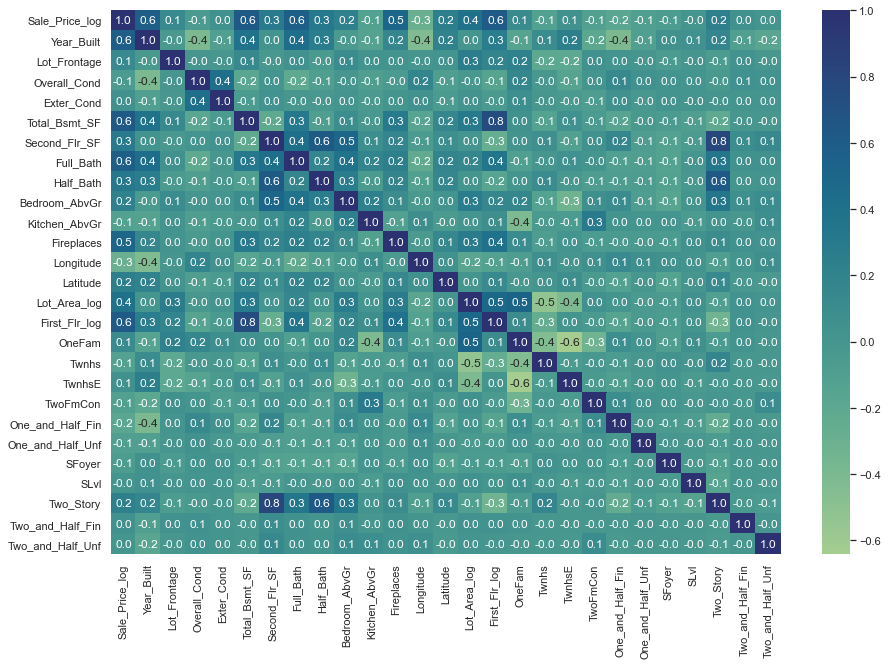

In [ ]:
plt.figure(figsize=(15,10))
corr_3 = df1.corr()
sns.heatmap(corr_3,cmap="crest",annot=True, fmt=".1f")
corr_3

Any of the new numerical variables are contributing to "Sale_Price".

### Model 1

In [ ]:
# We will use some methods from the sklearn module
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split, cross_val_score

We need to split our dataset into training and testing sets. We’ll perform this by importing train_test_split from sklearn.model_selection library. It is usually good to keep 70% of the data in your train dataset and the rest 30% in your test dataset.

In [ ]:
df1.columns

Index(['Sale_Price_log', 'Year_Built', 'Lot_Frontage', 'Overall_Cond',
       'Exter_Cond', 'Total_Bsmt_SF', 'Second_Flr_SF', 'Full_Bath',
       'Half_Bath', 'Bedroom_AbvGr', 'Kitchen_AbvGr', 'Fireplaces',
       'Longitude', 'Latitude', 'Lot_Area_log', 'First_Flr_log', 'OneFam',
       'Twnhs', 'TwnhsE', 'TwoFmCon', 'One_and_Half_Fin', 'One_and_Half_Unf',
       'SFoyer', 'SLvl', 'Two_Story', 'Two_and_Half_Fin', 'Two_and_Half_Unf'],
      dtype='object')

First Model is just applying conditiones as year when it was built the dwelling...

In [ ]:
# Dividing the training data set into X and Y
y1= df1.loc[:,['Sale_Price_log']]
X1 = df1.loc[:,['Year_Built','Lot_Frontage','Total_Bsmt_SF','Second_Flr_SF',
               'Lot_Area_log','First_Flr_log','Latitude','Longitude']]

In [ ]:
# We specify random seed so that the train and test data set always have the same rows, respectively
X1_train, X1_test, y1_train, y1_test = train_test_split(X1,y1,
                                                    train_size = 0.7,
                                                    test_size = 0.3,
                                                    random_state = 23127635)

In [ ]:
X1_train.columns

Index(['Year_Built', 'Lot_Frontage', 'Total_Bsmt_SF', 'Second_Flr_SF',
       'Lot_Area_log', 'First_Flr_log', 'Latitude', 'Longitude'],
      dtype='object')

In [ ]:
y1_train.columns

Index(['Sale_Price_log'], dtype='object')

In [ ]:
print(X1_train.shape)
print(X1_test.shape)
print(y1_train.shape)
print(y1_test.shape)

(1689, 8)
(724, 8)
(1689, 1)
(724, 1)


In [ ]:
#sklearn

regression_1=linear_model.LinearRegression()
regression_1.fit(X1_train,y1_train)

print('Intercept: \n', regression_1.intercept_)
print('Coefficients: \n', regression_1.coef_)


Intercept: 
 [-42.19767646]
Coefficients: 
 [[ 4.66922405e-03  3.94827151e-05  2.48523196e-04  3.86611472e-04
   7.98712668e-02  4.32467324e-01  8.35512948e-01 -6.14496867e-02]]


In [ ]:
# with statsmodels
from sklearn import linear_model
import statsmodels.api as sm

X1_train = sm.add_constant(X1_train) # adding a constant

model_1 = sm.OLS(y1_train, X1_train).fit()
predictions = model_1.predict(X1_train)

print_model_1 = model_1.summary()
print(print_model_1)

                            OLS Regression Results                            
Dep. Variable:         Sale_Price_log   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     850.8
Date:                Mon, 27 Nov 2023   Prob (F-statistic):               0.00
Time:                        22:41:36   Log-Likelihood:                 658.74
No. Observations:                1689   AIC:                            -1299.
Df Residuals:                    1680   BIC:                            -1251.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           -42.1977     20.099     -2.100

In [ ]:
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor

#create DataFrame to hold VIF values
vif_model1 = pd.DataFrame()
vif_model1['Variables'] = X1_train.columns

#calculate VIF for each predictor variable
vif_model1['VIF'] = [variance_inflation_factor(X1_train.values, i) for i in range(X1_train.shape[1])]

#view VIF for each predictor variable
print(vif_model1)


       Variables            VIF
0          const 25,285,975.487
1     Year_Built          1.542
2   Lot_Frontage          1.095
3  Total_Bsmt_SF          2.506
4  Second_Flr_SF          1.150
5   Lot_Area_log          1.490
6  First_Flr_log          2.925
7       Latitude          1.107
8      Longitude          1.303


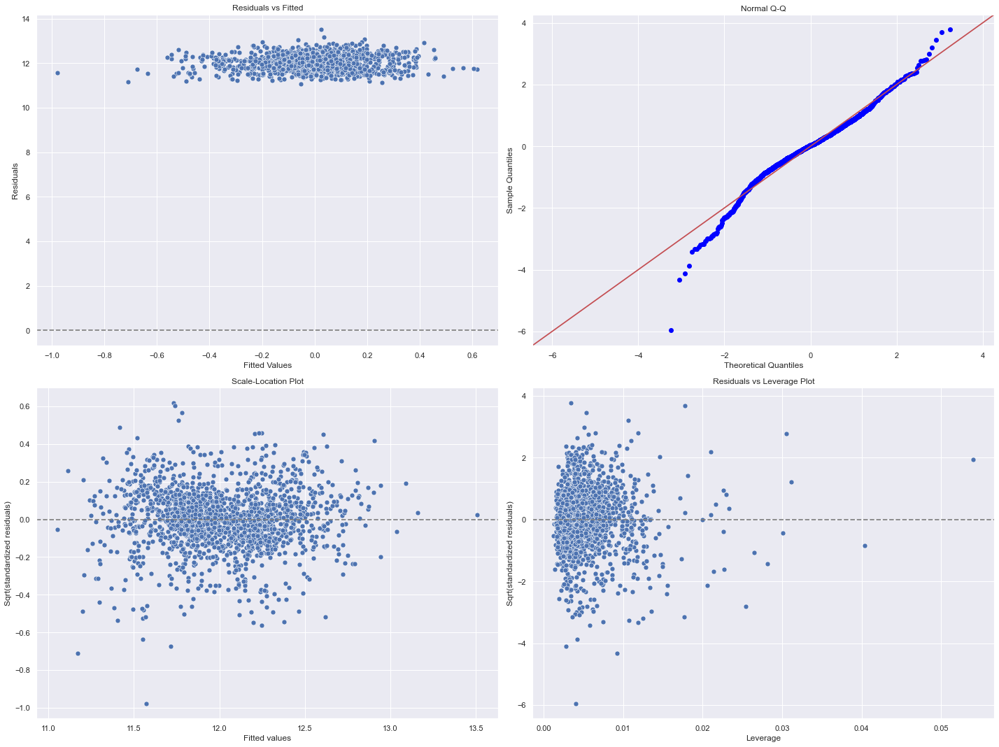

In [ ]:
# Get different Variables for diagnostic
residuals = (model_1.resid)           #Model residuals
fitted_value = (model_1.fittedvalues) #Model Values
stand_resids = model_1.resid_pearson
influence = model_1.get_influence()
leverage = influence.hat_matrix_diag

# PLot different diagnostic plots
plt.rcParams["figure.figsize"] = (20,15)
fig, ax = plt.subplots(nrows=2, ncols=2)

plt.style.use('seaborn')

# Residual vs Fitted Plot
sns.scatterplot(y=fitted_value, x=residuals, ax=ax[0, 0])
ax[0, 0].axhline(y=0, color='grey', linestyle='dashed')
ax[0, 0].set_xlabel('Fitted Values')
ax[0, 0].set_ylabel('Residuals')
ax[0, 0].set_title('Residuals vs Fitted')

# Normal Q-Q plot
sm.qqplot(residuals, fit=True, line='45',ax=ax[0, 1], c='#4C72B0')
ax[0, 1].set_title('Normal Q-Q')

# Scale-Location Plot
sns.scatterplot(x= fitted_value, y=residuals, ax=ax[1, 0])
ax[1, 0].axhline(y=0, color='grey', linestyle='dashed')
ax[1, 0].set_xlabel('Fitted values')
ax[1, 0].set_ylabel('Sqrt(standardized residuals)')
ax[1, 0].set_title('Scale-Location Plot')

# Residual vs Leverage Plot
sns.scatterplot(x=leverage, y=stand_resids, ax=ax[1, 1])
ax[1, 1].axhline(y=0, color='grey', linestyle='dashed')
ax[1, 1].set_xlabel('Leverage')
ax[1, 1].set_ylabel('Sqrt(standardized residuals)')
ax[1, 1].set_title('Residuals vs Leverage Plot')


plt.tight_layout()
plt.show()

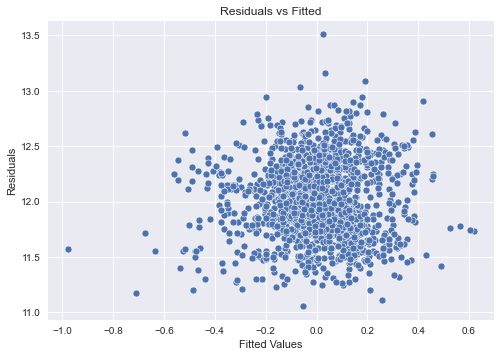

In [ ]:
sns.scatterplot(y=fitted_value, x=residuals )
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')

plt.show()

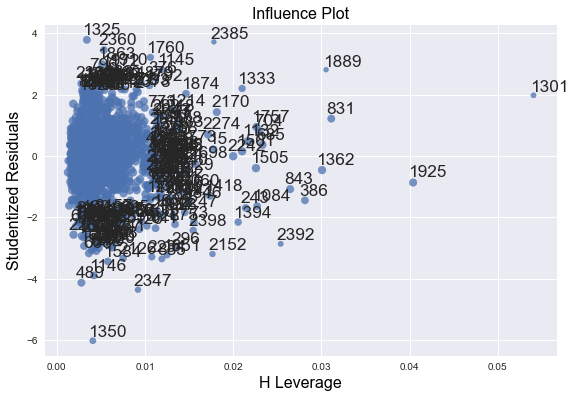

In [ ]:
fig = sm.graphics.influence_plot(model_1, criterion="cooks", size=5)
fig.tight_layout(pad=0.5)

### Model 2

In [ ]:
# Dividing the training data set into X and Y
y2= df1.loc[:,['Sale_Price_log']]
X2= df1.iloc[:,1:]

In [ ]:
X2.columns

Index(['Year_Built', 'Lot_Frontage', 'Overall_Cond', 'Exter_Cond',
       'Total_Bsmt_SF', 'Second_Flr_SF', 'Full_Bath', 'Half_Bath',
       'Bedroom_AbvGr', 'Kitchen_AbvGr', 'Fireplaces', 'Longitude', 'Latitude',
       'Lot_Area_log', 'First_Flr_log', 'OneFam', 'Twnhs', 'TwnhsE',
       'TwoFmCon', 'One_and_Half_Fin', 'One_and_Half_Unf', 'SFoyer', 'SLvl',
       'Two_Story', 'Two_and_Half_Fin', 'Two_and_Half_Unf'],
      dtype='object')

In [ ]:
y2.columns

Index(['Sale_Price_log'], dtype='object')

In [ ]:
# We specify random seed so that the train and test data set always have the same rows, respectively
X2_train, X2_test, y2_train, y2_test = train_test_split(X2,y2,
                                                    train_size = 0.7,
                                                    test_size = 0.3,
                                                    random_state = 23127635)

In [ ]:
print(X2_train.shape)
print(X2_test.shape)
print(y2_train.shape)
print(y2_test.shape)

(1689, 26)
(724, 26)
(1689, 1)
(724, 1)


In [ ]:
#sklearn

regression_2=linear_model.LinearRegression()
regression_2.fit(X2_train,y2_train)

print('Intercept: \n', regression_2.intercept_)
print('Coefficients: \n', regression_2.coef_)

Intercept: 
 [-49.10053408]
Coefficients: 
 [[ 5.13720815e-03  2.58613048e-04  7.01021031e-02  1.14786780e-02
   2.39231808e-04  3.42778963e-04  1.99426680e-02 -2.50537114e-03
  -4.83192547e-02 -8.67545956e-02  4.99792438e-02 -2.29965267e-01
   5.84448671e-01  1.05365350e-01  4.54441236e-01  8.02328527e-02
   1.13210758e-01  1.45408400e-01  4.66694783e-02  5.47680958e-02
   1.93957444e-02  4.02043410e-02  5.20156922e-02  7.79817137e-02
   5.21483674e-02  1.42557061e-01]]


In [ ]:
# with statsmodels
from sklearn import linear_model
import statsmodels.api as sm

X2_train = sm.add_constant(X2_train) # adding a constant

model_2 = sm.OLS(y2_train, X2_train).fit()
predictions = model_2.predict(X2_train)

print_model_2= model_2.summary()
print(print_model_2)

                            OLS Regression Results                            
Dep. Variable:         Sale_Price_log   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     478.9
Date:                Mon, 27 Nov 2023   Prob (F-statistic):               0.00
Time:                        22:41:47   Log-Likelihood:                 1097.5
No. Observations:                1689   AIC:                            -2141.
Df Residuals:                    1662   BIC:                            -1994.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const              -49.1005     15.902  

In [ ]:
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf

with open('summary.txt', 'w') as fh:
    fh.write(model_2.summary().as_text())

In [ ]:
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor

#create DataFrame to hold VIF values
vif_model2 = pd.DataFrame()
vif_model2['Variables'] = X2_train.columns

#calculate VIF for each predictor variable
vif_model2['VIF'] = [variance_inflation_factor(X2_train.values, i) for i in range(X2_train.shape[1])]

#view VIF for each predictor variable
print(vif_model2)

           Variables            VIF
0              const 26,326,247.537
1         Year_Built          3.043
2       Lot_Frontage          1.146
3       Overall_Cond          1.491
4         Exter_Cond          1.239
5      Total_Bsmt_SF          2.668
6      Second_Flr_SF          8.179
7          Full_Bath          2.571
8          Half_Bath          2.219
9      Bedroom_AbvGr          1.970
10     Kitchen_AbvGr          3.403
11        Fireplaces          1.451
12         Longitude          1.353
13          Latitude          1.156
14      Lot_Area_log          2.726
15     First_Flr_log          4.234
16            OneFam         14.406
17             Twnhs          5.372
18            TwnhsE          9.766
19          TwoFmCon          2.125
20  One_and_Half_Fin          2.639
21  One_and_Half_Unf          1.040
22            SFoyer          1.177
23              SLvl          1.223
24         Two_Story          7.839
25  Two_and_Half_Fin          1.114
26  Two_and_Half_Unf        

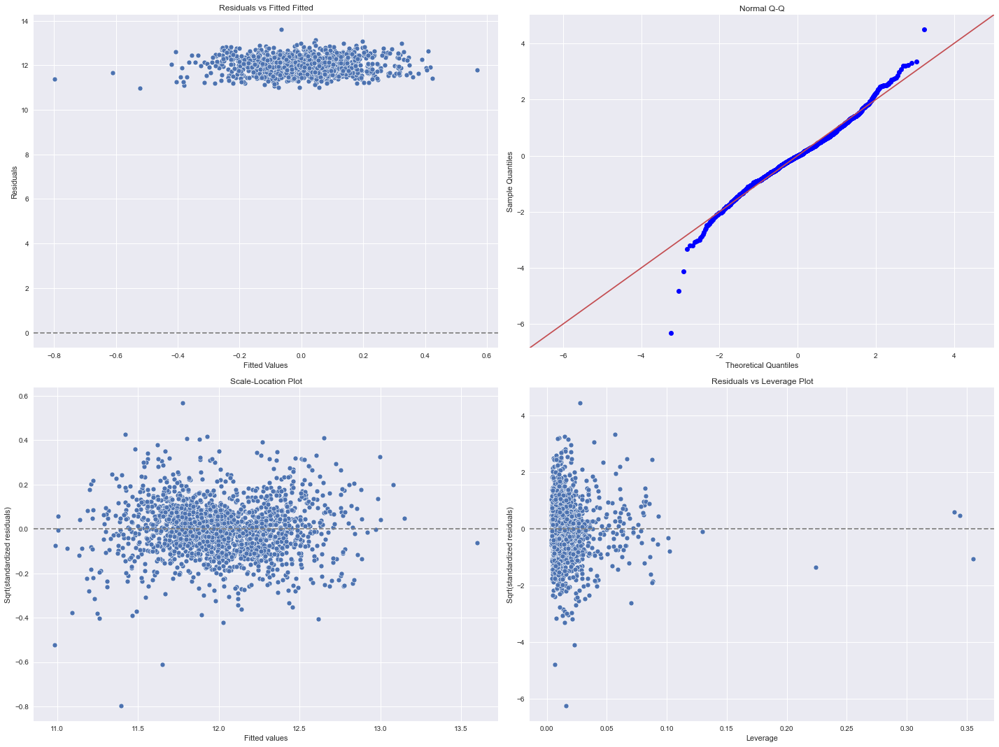

In [ ]:
# Get different Variables for diagnostic
residuals = model_2.resid
fitted_value = model_2.fittedvalues
stand_resids = model_2.resid_pearson
influence = model_2.get_influence()
leverage = influence.hat_matrix_diag

# PLot different diagnostic plots
plt.rcParams["figure.figsize"] = (20,15)
fig, ax = plt.subplots(nrows=2, ncols=2)

plt.style.use('seaborn')

# Residual vs Fitted Plot
sns.scatterplot(y=fitted_value, x=residuals, ax=ax[0, 0])
ax[0, 0].axhline(y=0, color='grey', linestyle='dashed')
ax[0, 0].set_xlabel('Fitted Values')
ax[0, 0].set_ylabel('Residuals')
ax[0, 0].set_title('Residuals vs Fitted Fitted')

# Normal Q-Q plot
sm.qqplot(residuals, fit=True, line='45',ax=ax[0, 1], c='#4C72B0')
ax[0, 1].set_title('Normal Q-Q')

# Scale-Location Plot
sns.scatterplot(x= fitted_value, y=residuals, ax=ax[1, 0])
ax[1, 0].axhline(y=0, color='grey', linestyle='dashed')
ax[1, 0].set_xlabel('Fitted values')
ax[1, 0].set_ylabel('Sqrt(standardized residuals)')
ax[1, 0].set_title('Scale-Location Plot')

# Residual vs Leverage Plot
sns.scatterplot(x=leverage, y=stand_resids, ax=ax[1, 1])
ax[1, 1].axhline(y=0, color='grey', linestyle='dashed')
ax[1, 1].set_xlabel('Leverage')
ax[1, 1].set_ylabel('Sqrt(standardized residuals)')
ax[1, 1].set_title('Residuals vs Leverage Plot')


plt.tight_layout()
plt.show()

### Model 3

In [ ]:
df2=df1.loc[:,['Sale_Price_log', 'Year_Built', 'Lot_Frontage', 'Overall_Cond',
               'Total_Bsmt_SF', 'Full_Bath','Bedroom_AbvGr', 'Kitchen_AbvGr', 'Fireplaces',
               'Latitude', 'Lot_Area_log', 'First_Flr_log','One_and_Half_Fin',
               'SFoyer', 'SLvl', 'Two_and_Half_Unf']]
df2.columns

Index(['Sale_Price_log', 'Year_Built', 'Lot_Frontage', 'Overall_Cond',
       'Total_Bsmt_SF', 'Full_Bath', 'Bedroom_AbvGr', 'Kitchen_AbvGr',
       'Fireplaces', 'Latitude', 'Lot_Area_log', 'First_Flr_log',
       'One_and_Half_Fin', 'SFoyer', 'SLvl', 'Two_and_Half_Unf'],
      dtype='object')

In [ ]:
print(df1.shape)
print(df2.shape)

(2413, 27)
(2413, 16)


#### Handling Outliers

In [ ]:
mean_df2= df2.mean()
std_df2= df2.std()
median_df2= df2.median()
skew_df2= df2.skew()
kurtosis_df2=df2.kurtosis()

data_df2= pd.DataFrame(data=[mean_df2,std_df2,median_df2,skew_df2,kurtosis_df2])
data_df2= data_df2.transpose()
data_df2= data_df2.rename(columns={0:'Mean',1:'Std Deviation',2:'Median',3:'Skew',4:'Kurtosis'})
data_df2

,Mean,Std Deviation,Median,Skew,Kurtosis
Sale_Price_log,12.005,0.371,11.977,0.156,0.675
Year_Built,"1,969.436",29.488,"1,971.000",-0.587,-0.439
Lot_Frontage,55.462,33.542,60.000,-0.081,1.166
Overall_Cond,5.649,1.128,5.000,0.630,0.957
Total_Bsmt_SF,"1,022.828",408.978,970.000,0.456,1.716
Full_Bath,1.539,0.545,2.000,0.245,-0.570
Bedroom_AbvGr,2.855,0.813,3.000,0.184,1.472
Kitchen_AbvGr,1.040,0.201,1.000,4.682,21.975
Fireplaces,0.603,0.649,1.000,0.739,0.138
Latitude,42.034,0.018,42.035,-0.508,-0.083


In [ ]:
print(df2.Kitchen_AbvGr.unique())
print(df2.One_and_Half_Fin.unique())
print(df2.SFoyer.unique())
print(df2.SLvl.unique())
print(df2.Two_and_Half_Unf.unique())

[1 2 3 0]
[0 1]
[0 1]
[0 1]
[0 1]


In [ ]:
kitchen = pd.get_dummies(df2['Kitchen_AbvGr'], prefix='kitchen', drop_first = True)
One_half = pd.get_dummies(df2['One_and_Half_Fin'], prefix='One_half_fin' ,drop_first = True)
Foyer= pd.get_dummies(df2['SFoyer'], prefix='Sfoyer',drop_first = True)
SLv = pd.get_dummies(df2['SLvl'], prefix='Slv',drop_first = True)
Two_half = pd.get_dummies(df2['Two_and_Half_Unf'],prefix='Two_half_unf',drop_first = True)

df3= pd.concat([df2, kitchen, One_half, Foyer, SLv, Two_half], axis = 1)
df3= df3.drop(columns=['Kitchen_AbvGr','One_and_Half_Fin','SFoyer','SLvl','Two_and_Half_Unf'])
df3

,Sale_Price_log,Year_Built,Lot_Frontage,Overall_Cond,Total_Bsmt_SF,Full_Bath,Bedroom_AbvGr,Fireplaces,Latitude,Lot_Area_log,First_Flr_log,kitchen_1,kitchen_2,kitchen_3,One_half_fin_1,Sfoyer_1,Slv_1,Two_half_unf_1
1143,11.712,1872,50,5,684,2,4,0,42.029,8.566,6.844,1,0,0,0,0,0,0
188,11.451,1875,54,8,780,1,2,0,42.034,8.755,6.659,1,0,0,1,0,0,0
1691,12.128,1879,75,8,819,2,3,1,42.028,9.510,7.179,1,0,0,0,0,0,1
626,12.491,1880,65,7,1240,1,4,1,42.029,9.367,7.185,1,0,0,0,0,0,0
704,11.783,1880,120,7,0,1,4,1,42.033,10.181,7.161,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446,12.459,2008,78,5,1614,2,3,1,42.054,9.231,7.413,1,0,0,0,0,0,0
211,12.134,2009,83,5,1212,2,3,0,42.025,9.251,7.100,1,0,0,0,0,0,0
220,12.201,2009,94,5,1226,2,3,0,42.025,9.250,7.112,1,0,0,0,0,0,0
58,12.279,2009,72,5,756,2,3,0,42.052,9.064,6.639,1,0,0,0,0,0,0


In [ ]:
df3.columns

Index(['Sale_Price_log', 'Year_Built', 'Lot_Frontage', 'Overall_Cond',
       'Total_Bsmt_SF', 'Full_Bath', 'Bedroom_AbvGr', 'Fireplaces', 'Latitude',
       'Lot_Area_log', 'First_Flr_log', 'kitchen_1', 'kitchen_2', 'kitchen_3',
       'One_half_fin_1', 'Sfoyer_1', 'Slv_1', 'Two_half_unf_1'],
      dtype='object')

In [ ]:
# Dividing the training data set into X and Y
y3= df3.loc[:,['Sale_Price_log']]
X3= df3.iloc[:,1:]

In [ ]:
# We specify random seed so that the train and test data set always have the same rows, respectively
X3_train, X3_test, y3_train, y3_test = train_test_split(X3,y3,
                                                    train_size = 0.7,
                                                    test_size = 0.3,
                                                    random_state = 23127635)

In [ ]:
print(X3_train.shape)
print(X3_test.shape)
print(y3_train.shape)
print(y3_test.shape)

(1689, 17)
(724, 17)
(1689, 1)
(724, 1)


In [ ]:
#sklearn

regression_3=linear_model.LinearRegression()
regression_3.fit(X3_train,y3_train)

print('Intercept: \n', regression_3.intercept_)
print('Coefficients: \n', regression_3.coef_)

Intercept: 
 [-39.84644932]
Coefficients: 
 [[ 5.56466061e-03  3.29936375e-04  7.40373266e-02  1.97531151e-04
   1.55308514e-01  2.62698579e-02  1.21551467e-01  9.05474800e-01
   1.01279351e-01  1.46741929e-01 -1.38494827e-01 -3.18118346e-01
  -2.84892410e-01  5.24675276e-02 -1.16384511e-02 -3.16999590e-02
   2.18161837e-01]]


In [ ]:
# with statsmodels
from sklearn import linear_model
import statsmodels.api as sm

X3_train = sm.add_constant(X3_train) # adding a constant

model_3 = sm.OLS(y3_train, X3_train).fit()
predictions = model_3.predict(X3_train)

print_model_3= model_3.summary()
print(print_model_3)

with open('summary3.txt', 'w') as fh:
    fh.write(model_3.summary().as_text())

                            OLS Regression Results                            
Dep. Variable:         Sale_Price_log   R-squared:                       0.792
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     375.0
Date:                Mon, 27 Nov 2023   Prob (F-statistic):               0.00
Time:                        22:41:49   Log-Likelihood:                 618.33
No. Observations:                1689   AIC:                            -1201.
Df Residuals:                    1671   BIC:                            -1103.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -39.8464     10.060     -3.

In [ ]:
#create DataFrame to hold VIF values
vif_model3 = pd.DataFrame()
vif_model3['Variables'] = X3_train.columns

#calculate VIF for each predictor variable
vif_model3['VIF'] = [variance_inflation_factor(X3_train.values, i) for i in range(X3_train.shape[1])]

#view VIF for each predictor variable
print(vif_model3)

         Variables           VIF
0            const 6,006,112.872
1       Year_Built         2.192
2     Lot_Frontage         1.112
3     Overall_Cond         1.235
4    Total_Bsmt_SF         2.606
5        Full_Bath         1.804
6    Bedroom_AbvGr         1.400
7       Fireplaces         1.261
8         Latitude         1.121
9     Lot_Area_log         1.505
10   First_Flr_log         3.037
11       kitchen_1        66.434
12       kitchen_2        65.803
13       kitchen_3         2.089
14  One_half_fin_1         1.273
15        Sfoyer_1         1.081
16           Slv_1         1.067
17  Two_half_unf_1         1.151


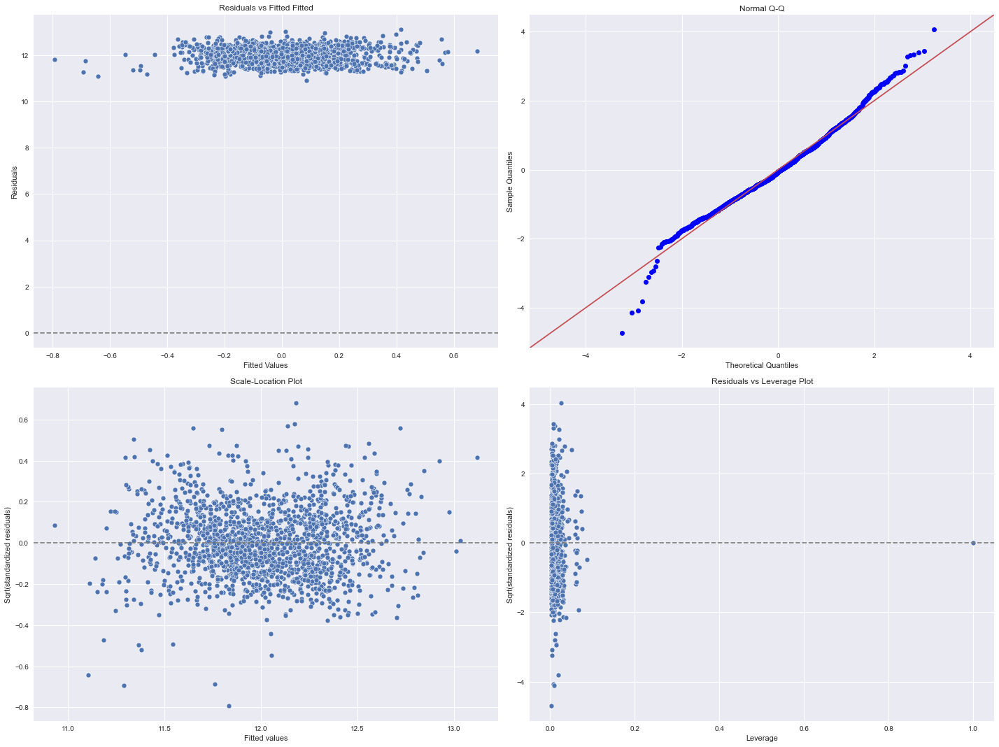

In [ ]:
# Get different Variables for diagnostic
residuals = model_3.resid
fitted_value = model_3.fittedvalues
stand_resids = model_3.resid_pearson
influence = model_3.get_influence()
leverage = influence.hat_matrix_diag

# PLot different diagnostic plots
plt.rcParams["figure.figsize"] = (20,15)
fig, ax = plt.subplots(nrows=2, ncols=2)

plt.style.use('seaborn')

# Residual vs Fitted Plot
sns.scatterplot(y=fitted_value, x=residuals, ax=ax[0, 0])
ax[0, 0].axhline(y=0, color='grey', linestyle='dashed')
ax[0, 0].set_xlabel('Fitted Values')
ax[0, 0].set_ylabel('Residuals')
ax[0, 0].set_title('Residuals vs Fitted Fitted')

# Normal Q-Q plot
sm.qqplot(residuals, fit=True, line='45',ax=ax[0, 1], c='#4C72B0')
ax[0, 1].set_title('Normal Q-Q')

# Scale-Location Plot
sns.scatterplot(x= fitted_value, y=residuals, ax=ax[1, 0])
ax[1, 0].axhline(y=0, color='grey', linestyle='dashed')
ax[1, 0].set_xlabel('Fitted values')
ax[1, 0].set_ylabel('Sqrt(standardized residuals)')
ax[1, 0].set_title('Scale-Location Plot')

# Residual vs Leverage Plot
sns.scatterplot(x=leverage, y=stand_resids, ax=ax[1, 1])
ax[1, 1].axhline(y=0, color='grey', linestyle='dashed')
ax[1, 1].set_xlabel('Leverage')
ax[1, 1].set_ylabel('Sqrt(standardized residuals)')
ax[1, 1].set_title('Residuals vs Leverage Plot')


plt.tight_layout()
plt.show()

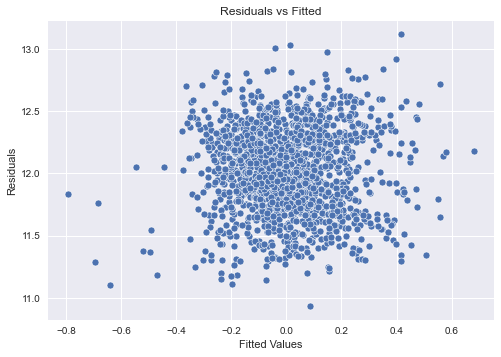

In [ ]:
sns.scatterplot(y=fitted_value, x=residuals )
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')

plt.show()

In [ ]:
df3.columns

Index(['Sale_Price_log', 'Year_Built', 'Lot_Frontage', 'Overall_Cond',
       'Total_Bsmt_SF', 'Full_Bath', 'Bedroom_AbvGr', 'Fireplaces', 'Latitude',
       'Lot_Area_log', 'First_Flr_log', 'kitchen_1', 'kitchen_2', 'kitchen_3',
       'One_half_fin_1', 'Sfoyer_1', 'Slv_1', 'Two_half_unf_1'],
      dtype='object')

### Model 4

In [ ]:
# Dividing the training data set into X and Y
y4= df3['Sale_Price_log']
X4= df3.loc[:,['Year_Built', 'Lot_Frontage', 'Overall_Cond','Total_Bsmt_SF',
               'Full_Bath', 'Bedroom_AbvGr', 'Fireplaces', 'Latitude',
               'Lot_Area_log', 'First_Flr_log', 'One_half_fin_1', 'Two_half_unf_1']]

In [ ]:
# We specify random seed so that the train and test data set always have the same rows, respectively
X4_train, X4_test, y4_train, y4_test = train_test_split(X4,y4,
                                                    train_size = 0.7,
                                                    test_size = 0.3,
                                                    random_state = 23127635)

In [ ]:
print(X4_train.shape)
print(X4_test.shape)
print(y4_train.shape)
print(y4_test.shape)

(1689, 12)
(724, 12)
(1689,)
(724,)


In [ ]:
#sklearn

regression_4=linear_model.LinearRegression()
regression_4.fit(X4_train,y4_train)

print('Intercept: \n', regression_4.intercept_)
print('Coefficients: \n', regression_4.coef_)

Intercept: 
 -46.06780496127419
Coefficients: 
 [5.89114952e-03 3.27165826e-04 7.83355009e-02 2.09336166e-04
 1.40534591e-01 2.01765801e-02 1.29836515e-01 1.03750793e+00
 1.07103110e-01 1.21824463e-01 6.34402043e-02 2.16519170e-01]


In [ ]:
# with statsmodels
from sklearn import linear_model
import statsmodels.api as sm

X4_train = sm.add_constant(X4_train) # adding a constant

model_4 = sm.OLS(y4_train, X4_train).fit()
predictions = model_4.predict(X4_train)

print_model_4= model_4.summary()
print(print_model_4)

                            OLS Regression Results                            
Dep. Variable:         Sale_Price_log   R-squared:                       0.784
Model:                            OLS   Adj. R-squared:                  0.783
Method:                 Least Squares   F-statistic:                     508.3
Date:                Mon, 27 Nov 2023   Prob (F-statistic):               0.00
Time:                        22:41:52   Log-Likelihood:                 586.92
No. Observations:                1689   AIC:                            -1148.
Df Residuals:                    1676   BIC:                            -1077.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -46.0678     10.107     -4.

In [ ]:
#create DataFrame to hold VIF values
vif_model4 = pd.DataFrame()
vif_model4['Variables'] = X4_train.columns

#calculate VIF for each predictor variable
vif_model4['VIF'] = [variance_inflation_factor(X4_train.values, i) for i in range(X4_train.shape[1])]

#view VIF for each predictor variable
print(vif_model4)

         Variables           VIF
0            const 5,859,167.436
1       Year_Built         2.025
2     Lot_Frontage         1.108
3     Overall_Cond         1.202
4    Total_Bsmt_SF         2.508
5        Full_Bath         1.709
6    Bedroom_AbvGr         1.350
7       Fireplaces         1.228
8         Latitude         1.091
9     Lot_Area_log         1.492
10   First_Flr_log         2.959
11  One_half_fin_1         1.259
12  Two_half_unf_1         1.096


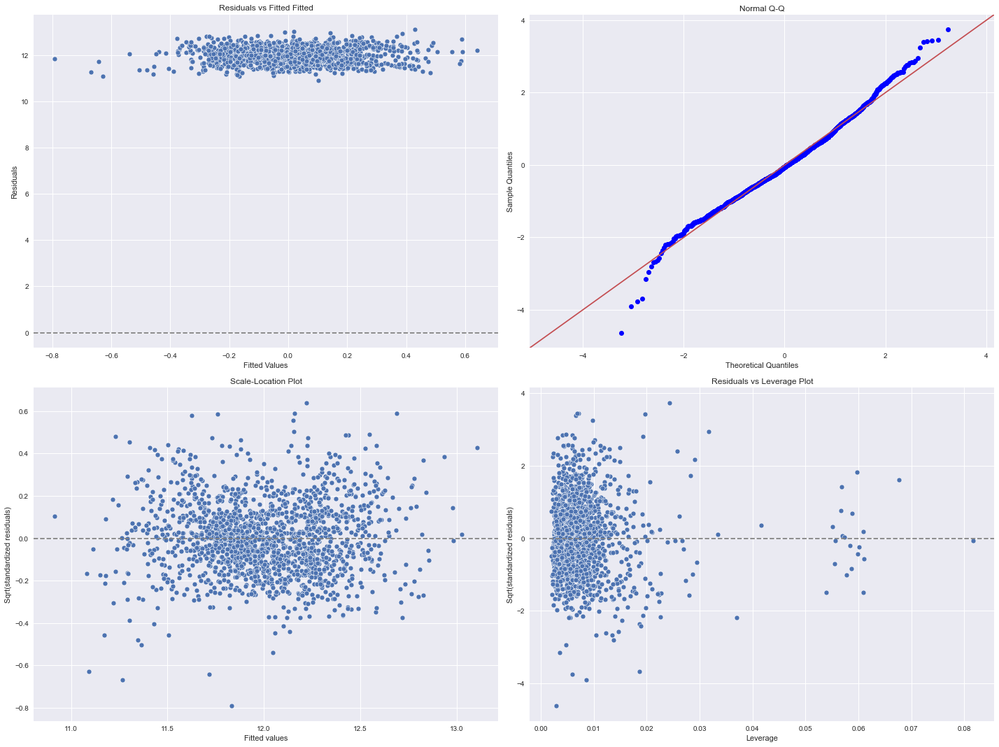

In [ ]:
# Get different Variables for diagnostic
residuals = model_4.resid
fitted_value = model_4.fittedvalues
stand_resids = model_4.resid_pearson
influence = model_4.get_influence()
leverage = influence.hat_matrix_diag

# PLot different diagnostic plots
plt.rcParams["figure.figsize"] = (20,15)
fig, ax = plt.subplots(nrows=2, ncols=2)

plt.style.use('seaborn')

# Residual vs Fitted Plot
sns.scatterplot(y=fitted_value, x=residuals, ax=ax[0, 0])
ax[0, 0].axhline(y=0, color='grey', linestyle='dashed')
ax[0, 0].set_xlabel('Fitted Values')
ax[0, 0].set_ylabel('Residuals')
ax[0, 0].set_title('Residuals vs Fitted Fitted')

# Normal Q-Q plot
sm.qqplot(residuals, fit=True, line='45',ax=ax[0, 1], c='#4C72B0')
ax[0, 1].set_title('Normal Q-Q')

# Scale-Location Plot
sns.scatterplot(x= fitted_value, y=residuals, ax=ax[1, 0])
ax[1, 0].axhline(y=0, color='grey', linestyle='dashed')
ax[1, 0].set_xlabel('Fitted values')
ax[1, 0].set_ylabel('Sqrt(standardized residuals)')
ax[1, 0].set_title('Scale-Location Plot')

# Residual vs Leverage Plot
sns.scatterplot(x=leverage, y=stand_resids, ax=ax[1, 1])
ax[1, 1].axhline(y=0, color='grey', linestyle='dashed')
ax[1, 1].set_xlabel('Leverage')
ax[1, 1].set_ylabel('Sqrt(standardized residuals)')
ax[1, 1].set_title('Residuals vs Leverage Plot')


plt.tight_layout()
plt.show()

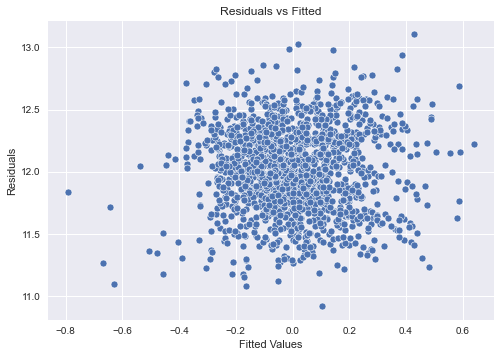

In [ ]:
sns.scatterplot(y=fitted_value, x=residuals )
plt.title('Residuals vs Fitted')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')

plt.show()